Modified Dataset

In [6]:
import torch
import torchvision
from torchvision.datasets import CocoDetection
from torchvision.transforms import ToTensor
import os

class CocoDetectionCustom(CocoDetection):
    def __init__(self, root, annFile, transform=None, target_transform=None):
        super().__init__(root, annFile, transform, target_transform)

    def __getitem__(self, idx):
        # Get the raw image and target from the parent class
        img, target = super().__getitem__(idx)

        # Check if the image is already a tensor
        if not isinstance(img, torch.Tensor):
            img = ToTensor()(img)

        # Extract bounding boxes
        bbox_list = [ann['bbox'] for ann in target]

        # Convert bounding boxes to [x_min, y_min, x_max, y_max]
        boxes = torch.tensor(
            [[x, y, x + w, y + h] for x, y, w, h in bbox_list],
            dtype=torch.float32
        )

        # Extract category IDs
        labels = torch.tensor([ann['category_id'] for ann in target], dtype=torch.int64)

        # Initialize a mask tensor of the same size as the image (height x width)
        height, width = img.shape[1], img.shape[2]
        masks = torch.zeros((len(target), height, width), dtype=torch.uint8)

        # Loop through each annotation and create the mask for each object
        for i, ann in enumerate(target):
            # Extract bounding box coordinates
            x_min, y_min, x_max, y_max = boxes[i].int()

            # Create a mask for the bounding box area
            masks[i, y_min:y_max, x_min:x_max] = 1  # Set the region inside the box to 1

        # Create the final target dictionary
        target_dict = {
            'boxes': boxes,
            'labels': labels,
            'masks': masks
        }

        return img, target_dict

Model Initialization

In [7]:
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torch.utils.data import DataLoader
from torchvision.transforms import Compose, ToTensor

# Initialize the model
print("Initializing Model...")
model = maskrcnn_resnet50_fpn(pretrained=True)
device = torch.device('cuda' if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu")
model.to(device)
print("Model loaded successfully and is running on", device)

# Define transformations
transform = Compose([ToTensor()])

# File paths for your COCO annotations and images
train_images = "datasets/train"
train_annotations = "datasets/train/_clean_annotations.coco.json"

valid_images = "datasets/valid"
valid_annotations = "datasets/valid/_clean_annotations.coco.json"

test_images = "datasets/test"
test_annotations = "datasets/test/_clean_annotations.coco.json"

# Define datasets
train_dataset = CocoDetectionCustom(root=train_images, annFile=train_annotations, transform=transform)
valid_dataset = CocoDetectionCustom(root=valid_images, annFile=valid_annotations, transform=transform)
test_dataset = CocoDetectionCustom(root=test_images, annFile=test_annotations, transform=transform)

# Define the collate function
def collate_fn(batch):
    images, targets = zip(*batch)
    return list(images), list(targets)

# Define your dataloaders
train_dataloader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=collate_fn)
valid_dataloader = DataLoader(valid_dataset, batch_size=4, shuffle=False, collate_fn=collate_fn)
test_dataloader = DataLoader(test_dataset, batch_size=4, shuffle=False, collate_fn=collate_fn)

# Optimizer and learning rate scheduler
optimizer = torch.optim.SGD(model.parameters(), lr=0.001, momentum=0.9, weight_decay=0.0005)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

Initializing Model...


/home/kgalvez/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/kgalvez/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Model loaded successfully and is running on cuda
loading annotations into memory...
Done (t=0.34s)
creating index...
index created!
loading annotations into memory...
Done (t=0.06s)
creating index...
index created!
loading annotations into memory...
Done (t=0.07s)
creating index...
index created!


Accuracy Computation

In [16]:
import numpy as np

def compute_iou(box1, box2):
    x_min1, y_min1, x_max1, y_max1 = box1
    x_min2, y_min2, x_max2, y_max2 = box2

    # Calculate the intersection
    inter_x_min = max(x_min1, x_min2)
    inter_y_min = max(y_min1, y_min2)
    inter_x_max = min(x_max1, x_max2)
    inter_y_max = min(y_max1, y_max2)

    inter_area = max(0, inter_x_max - inter_x_min) * max(0, inter_y_max - inter_y_min)

    # Calculate the union
    area1 = (x_max1 - x_min1) * (y_max1 - y_min1)
    area2 = (x_max2 - x_min2) * (y_max2 - y_min2)
    union_area = area1 + area2 - inter_area

    if union_area == 0:
        return 0  # Avoid division by zero
    return inter_area / union_area

def compute_ap(gt_boxes, pred_boxes, iou_threshold=0.5):
    """
    Computes Average Precision for a single IoU threshold.
    """
    tp = 0  # True Positives
    fp = 0  # False Positives
    fn = len(gt_boxes)  # False Negatives (initially all ground truths are unmatched)

    # Sort predictions by confidence scores (descending)
    pred_boxes = sorted(pred_boxes, key=lambda x: x[1], reverse=True)

    matched_gt = set()  # Track matched ground truth boxes

    for pred_box, score in pred_boxes:
        for i, gt_box in enumerate(gt_boxes):
            if i in matched_gt:
                continue  # Skip already matched ground truth boxes
            iou = compute_iou(gt_box, pred_box)
            if iou >= iou_threshold:
                tp += 1
                fn -= 1
                matched_gt.add(i)
                break
        else:
            fp += 1

    # Precision and recall
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    return precision, recall

def compute_map(gt_boxes_list, pred_boxes_list, iou_thresholds=np.linspace(0.5, 0.95, 10)):
    """
    Computes mAP across multiple IoU thresholds.
    """
    aps = []
    for iou_thresh in iou_thresholds:
        precision_list = []
        recall_list = []
        for gt_boxes, pred_boxes in zip(gt_boxes_list, pred_boxes_list):
            precision, recall = compute_ap(gt_boxes, pred_boxes, iou_threshold=iou_thresh)
            precision_list.append(precision)
            recall_list.append(recall)
        mean_precision = np.mean(precision_list)
        aps.append(mean_precision)
    return np.mean(aps)  # mAP is the mean of all APs

Training

In [23]:
from tqdm import tqdm
import time

# Define the training, validation, and testing loops
def train_one_epoch(model, optimizer, dataloader, device):
    model.train()
    epoch_loss = 0.0

    train_start_time = time.time()
    with tqdm(total=len(dataloader), desc="Training", unit="batch") as train_bar:
        for images, targets in dataloader:
            images = [img.to(device) for img in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            # Zero the parameter gradients
            optimizer.zero_grad()

            try:
                # Forward pass
                loss_dict = model(images, targets)
                # print(loss_dict)
                losses = sum(loss for loss in loss_dict.values())

                # Backward pass and optimization
                losses.backward()
                optimizer.step()

                epoch_loss += losses.item()

            except AssertionError as e:
                # print(f"Skipping batch due to invalid bounding box: {e}")
                pass
            
            # Update progress bar
            train_bar.update(1)

    # Statistics
    avg_train_loss = epoch_loss / len(dataloader)
    train_end_time = time.time()
    train_duration = train_end_time - train_start_time
    # tqdm.write(f"Training Loss: {avg_train_loss:.4f}")
    tqdm.write(f"Training Time: {train_duration:.2f} seconds")
    return avg_train_loss

def validate(model, dataloader, device):
    model.eval()
    val_loss = 0.0
    confidence_threshold = 0.5
    iou_threshold = 0.5
    correct_predictions = 0
    total_ground_truth = 0
    all_gt_boxes = []
    all_pred_boxes = []

    valid_start_time = time.time()
    with tqdm(total=len(dataloader), desc="Validating", unit="batch") as valid_bar:
        with torch.no_grad():
            for images, targets in dataloader:
                images = [img.to(device) for img in images]
                targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

                try:
                    # Compute Loss
                    model.train()
                    loss_dict = model(images, targets)
                    losses = sum(loss for loss in loss_dict.values())
                    val_loss += losses.item()
                    

                    # Compute IoU and mAP accuracies
                    model.eval()
                    outputs = model(images)
                    # Get predictions
                    for i, (output, target) in enumerate(zip(outputs, targets)):

                        # Extract predicted boxes, labels, and masks
                        boxes = output['boxes'].cpu().numpy()
                        scores = output['scores'].cpu().numpy()

                        # Filter predictions based on confidence scores
                        high_conf_indices = scores > confidence_threshold
                        boxes = boxes[high_conf_indices]
                        scores = scores[high_conf_indices]

                        # Format predictions as (box, score)
                        pred_boxes_with_scores = [(box, score) for box, score in zip(boxes, scores)]

                        # Get ground truth boxes
                        gt_boxes = target['boxes'].cpu().numpy()
                        total_ground_truth += len(gt_boxes)

                        all_gt_boxes.append(gt_boxes)
                        all_pred_boxes.append(pred_boxes_with_scores)

                        # Match predictions to ground truth
                        for gt_box in gt_boxes:
                            for pred_box in boxes:
                                iou = compute_iou(gt_box, pred_box)
                                if iou >= iou_threshold:
                                    correct_predictions += 1
                                    break  # Avoid double-counting the ground truth box
                except AssertionError as e:
                    # print(f"Skipping batch due to invalid bounding box: {e}")
                    pass
                except IndexError as e:
                    # print(f"Skipping batch due to IndexError: {e}")
                    continue

                # Update progress bar
                valid_bar.update(1)

    
    # Compute mAP accuracy
    iou_thresholds = np.linspace(0.5, 0.95, 10)  # IoU thresholds from 0.50 to 0.95
    map_score = compute_map(all_gt_boxes, all_pred_boxes, iou_thresholds=iou_thresholds)
    print(f"mAP@[0.50:0.95]: {map_score:.4f}")

    # Calculate IoU-based accuracy
    accuracy = correct_predictions / total_ground_truth if total_ground_truth > 0 else 0
    print(f"IoU-based Accuracy: {accuracy:.4f}")

    # Statistics
    avg_valid_loss = val_loss / len(dataloader)
    valid_end_time = time.time()
    valid_duration = valid_end_time - valid_start_time
    tqdm.write(f"Validation Time: {valid_duration:.2f} seconds")

    return avg_valid_loss


In [10]:
# Training loop
num_epochs = 20
training_losses = []
validation_losses = []
for epoch in range(num_epochs):
    print(f"Epoch {epoch + 1}/{num_epochs}")
    train_loss = train_one_epoch(model, optimizer, train_dataloader, device)
    val_loss = validate(model, valid_dataloader, device)
    scheduler.step()

    training_losses.append(train_loss)
    validation_losses.append(val_loss)
    print(f"Epoch [{epoch+1}/{num_epochs}] - Train Loss: {train_loss:.4f} - Valid Loss: {val_loss:.4f}\n")

print("Training completed.")


Training:   0%|          | 0/951 [00:00<?, ?batch/s]

Epoch 1/20


Training:   0%|          | 0/951 [00:00<?, ?batch/s]

Training Time: 354.22 seconds
Epoch [1/20] - Train Loss: 0.3848

Epoch 2/20


Training:   0%|          | 0/951 [00:00<?, ?batch/s]

Training Time: 352.33 seconds
Epoch [2/20] - Train Loss: 0.3746

Epoch 3/20


Training:   0%|          | 0/951 [00:00<?, ?batch/s]

Training Time: 341.24 seconds
Epoch [3/20] - Train Loss: 0.3493

Epoch 4/20


Training:   0%|          | 0/951 [00:00<?, ?batch/s]

Training Time: 332.42 seconds
Epoch [4/20] - Train Loss: 0.3194

Epoch 5/20


Training:   0%|          | 0/951 [00:00<?, ?batch/s]

Training Time: 356.53 seconds
Epoch [5/20] - Train Loss: 0.3327

Epoch 6/20


Training:   0%|          | 0/951 [00:00<?, ?batch/s]

Training Time: 342.95 seconds
Epoch [6/20] - Train Loss: 0.2924

Epoch 7/20


Training:   0%|          | 0/951 [00:00<?, ?batch/s]

Training Time: 355.34 seconds
Epoch [7/20] - Train Loss: 0.2978

Epoch 8/20


Training:   0%|          | 0/951 [00:00<?, ?batch/s]

Training Time: 344.74 seconds
Epoch [8/20] - Train Loss: 0.2862

Epoch 9/20


Training:   0%|          | 0/951 [00:00<?, ?batch/s]

Training Time: 355.35 seconds
Epoch [9/20] - Train Loss: 0.2905

Epoch 10/20


Training:   0%|          | 0/951 [00:00<?, ?batch/s]

Training Time: 355.98 seconds
Epoch [10/20] - Train Loss: 0.2910

Epoch 11/20


Training:   0%|          | 0/951 [00:00<?, ?batch/s]

Training Time: 344.35 seconds
Epoch [11/20] - Train Loss: 0.2746

Epoch 12/20


Training:   0%|          | 0/951 [00:00<?, ?batch/s]

Training Time: 354.10 seconds
Epoch [12/20] - Train Loss: 0.2906

Epoch 13/20


Training:   1%|          | 6/951 [00:00<00:18, 50.33batch/s]

Training Time: 345.04 seconds
Epoch [13/20] - Train Loss: 0.2737

Epoch 14/20


Training:   0%|          | 0/951 [00:00<?, ?batch/s]

Training Time: 329.58 seconds
Epoch [14/20] - Train Loss: 0.2660

Epoch 15/20


Training:   0%|          | 0/951 [00:00<?, ?batch/s]

Training Time: 347.64 seconds
Epoch [15/20] - Train Loss: 0.2725

Epoch 16/20


Training:   0%|          | 0/951 [00:00<?, ?batch/s]

Training Time: 353.30 seconds
Epoch [16/20] - Train Loss: 0.2839

Epoch 17/20


Training:   0%|          | 0/951 [00:00<?, ?batch/s]

Training Time: 344.68 seconds
Epoch [17/20] - Train Loss: 0.2737

Epoch 18/20


Training:   0%|          | 0/951 [00:00<?, ?batch/s]

Training Time: 354.86 seconds
Epoch [18/20] - Train Loss: 0.2833

Epoch 19/20


Training:   0%|          | 0/951 [00:00<?, ?batch/s]

Training Time: 343.74 seconds
Epoch [19/20] - Train Loss: 0.2747

Epoch 20/20


Training: 100%|██████████| 951/951 [05:38<00:00,  2.81batch/s]

Training Time: 338.51 seconds
Epoch [20/20] - Train Loss: 0.2652

Training completed.


Saving Model and Graphs

In [11]:
# Save the model state_dict
torch.save(model.state_dict(), f"{num_epochs}_epoch_model.pth")

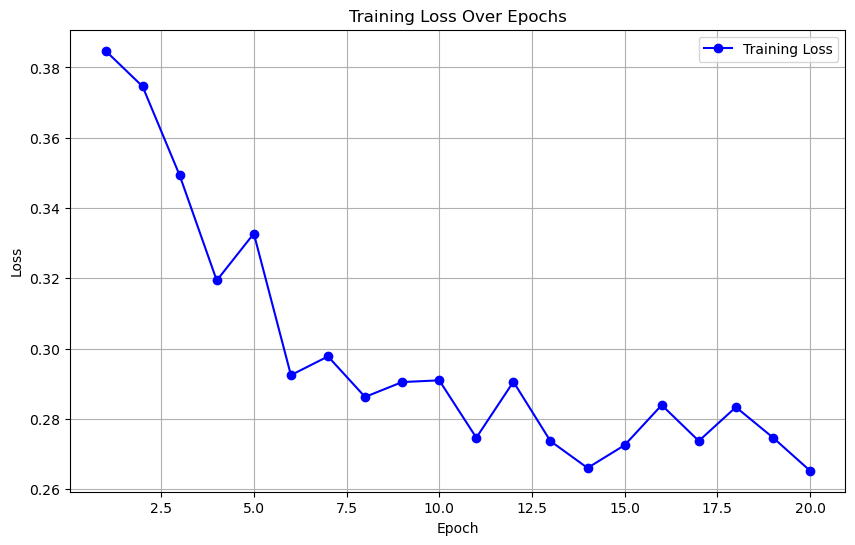

In [27]:
import matplotlib.pyplot as plt
# Plot Training Loss
plt.figure(figsize=(10, 6))
plt.plot(range(1, num_epochs + 1), training_losses, marker='o', label='Training Loss', color='b')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Loss Over Epochs")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
import torch
from torchvision.models.detection import maskrcnn_resnet50_fpn

device = torch.device('cuda' if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu")

# import model
print("Initializing Model...")
model = maskrcnn_resnet50_fpn(pretrained=True)
model.load_state_dict(torch.load("/Users/kylegabrielgalvez/Desktop/20_epoch_optimizer_update/20_epoch_model.pth", weights_only=True))
model.to(device)
print("Model loaded successfully and is running on", device)

model.eval()

Predictions

Image 1, Prediction 1


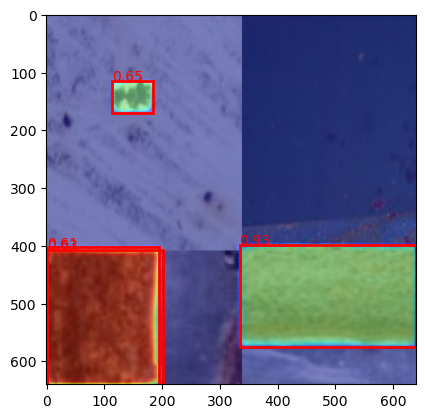

Image 1, Prediction 2


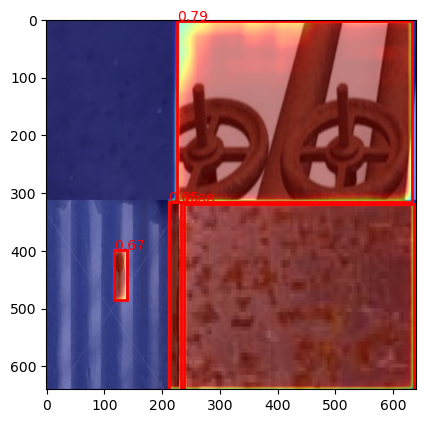

Image 1, Prediction 3


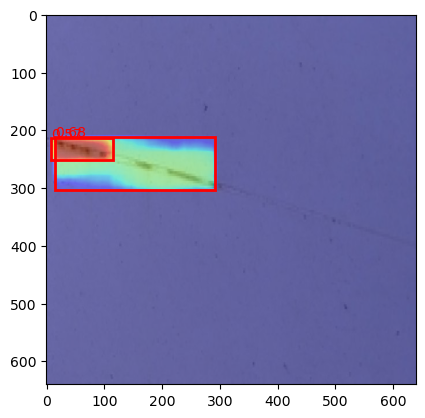

Image 1, Prediction 4


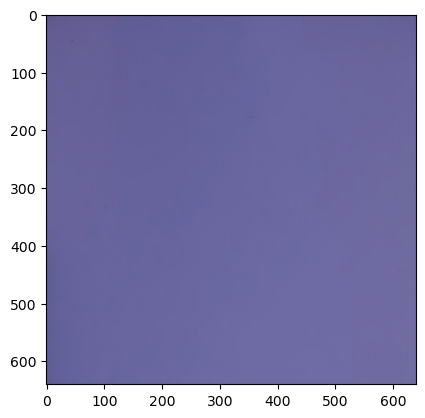

Image 2, Prediction 1


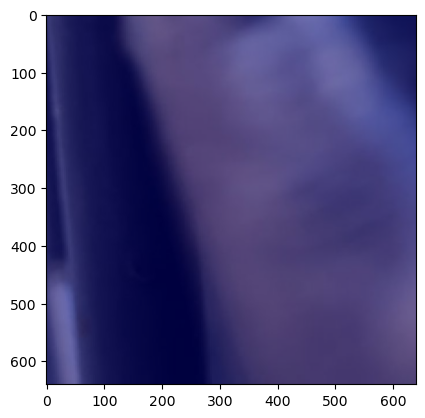

Image 2, Prediction 2


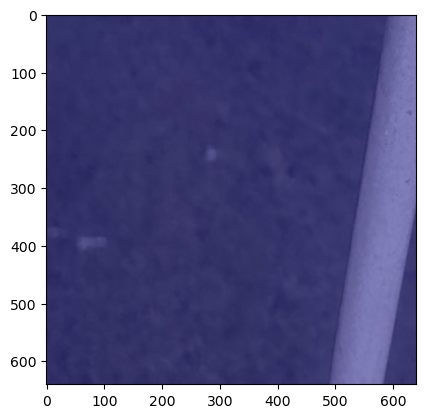

Image 2, Prediction 3


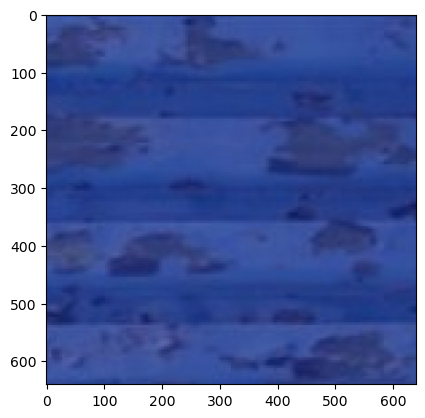

Image 2, Prediction 4


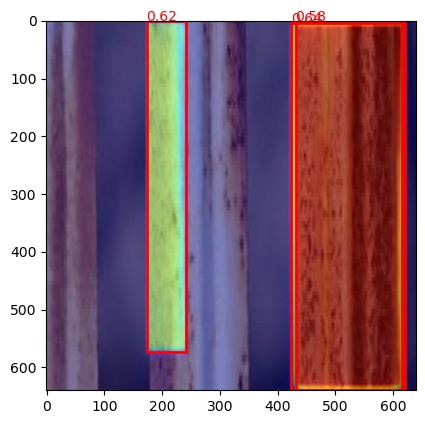

Image 3, Prediction 1


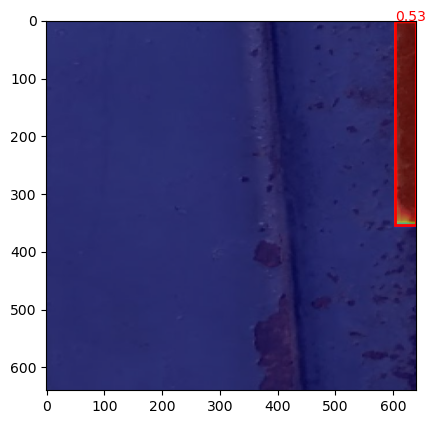

Image 3, Prediction 2


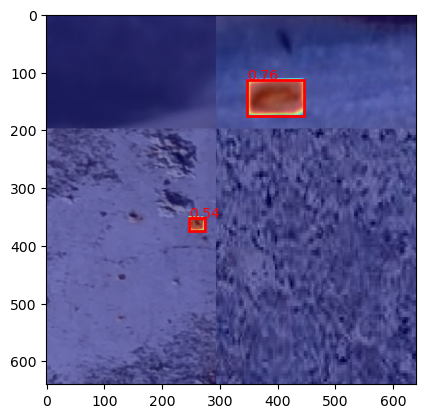

Image 3, Prediction 3


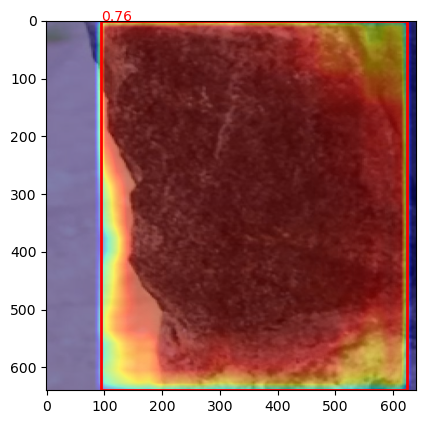

Image 3, Prediction 4


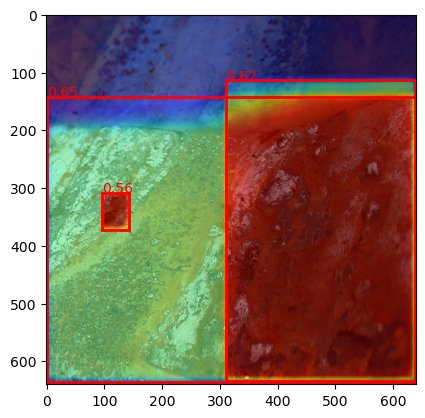

Image 4, Prediction 1


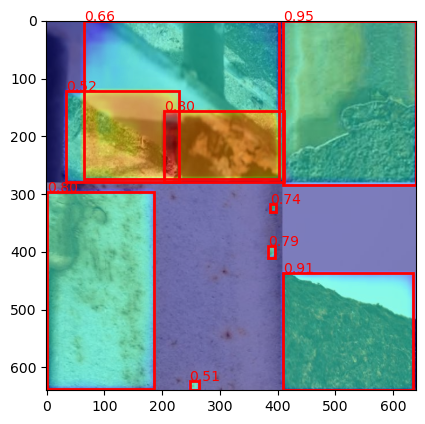

Image 4, Prediction 2


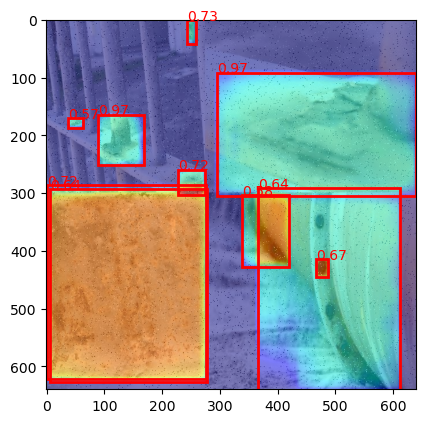

Image 4, Prediction 3


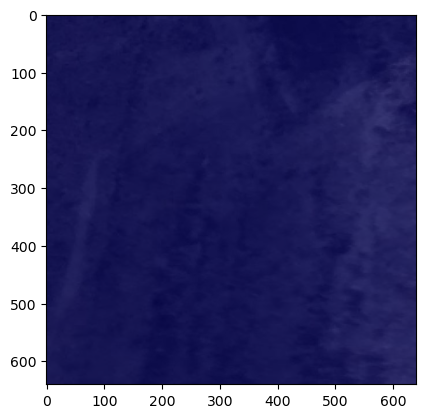

Image 4, Prediction 4


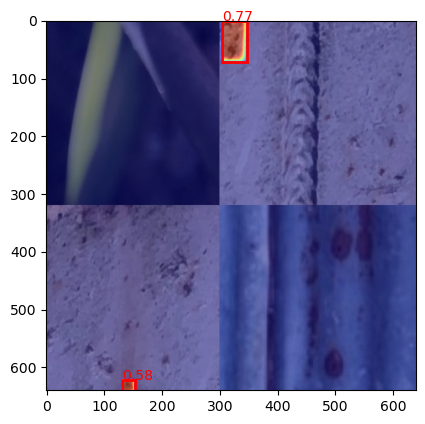

Image 5, Prediction 1


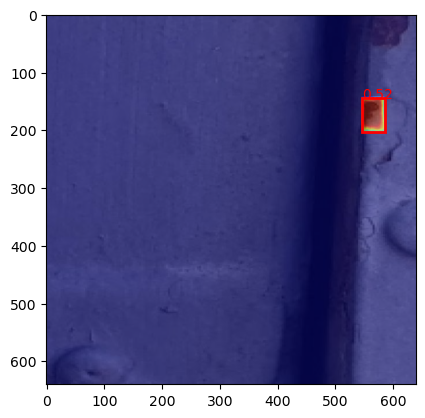

Image 5, Prediction 2


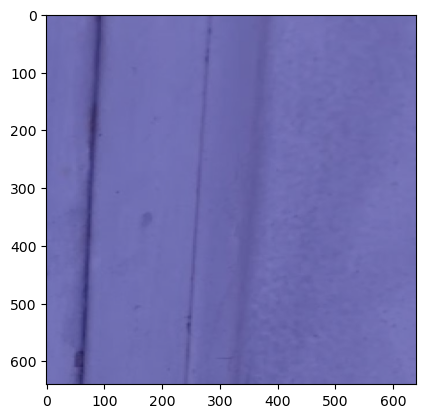

Image 5, Prediction 3


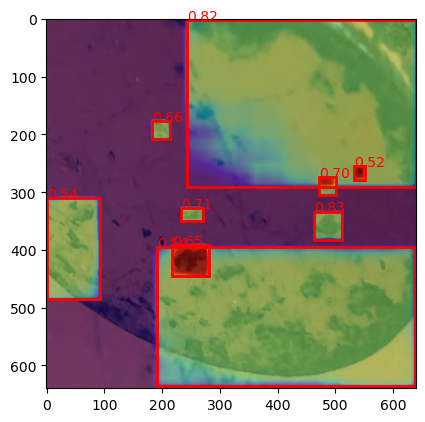

Image 5, Prediction 4


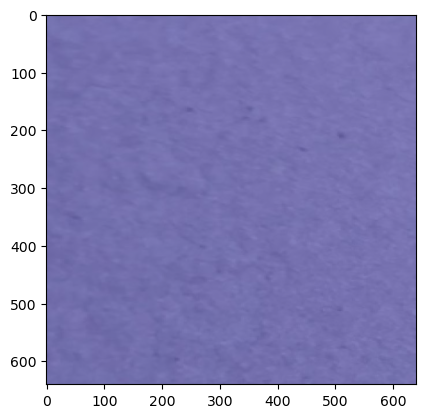

Image 6, Prediction 1


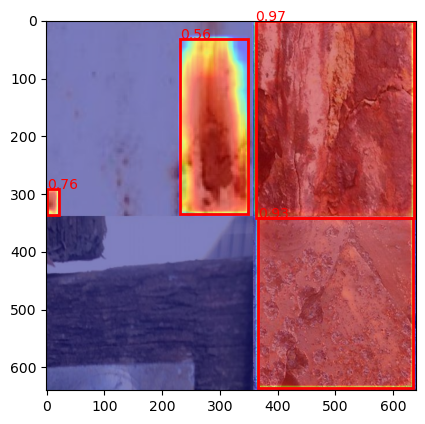

Image 6, Prediction 2


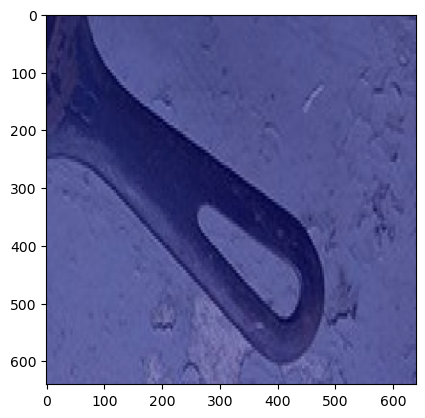

Image 6, Prediction 3


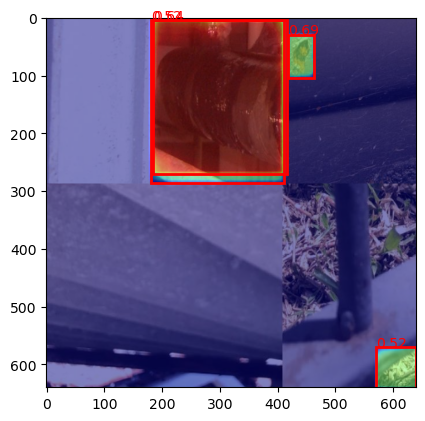

Image 6, Prediction 4


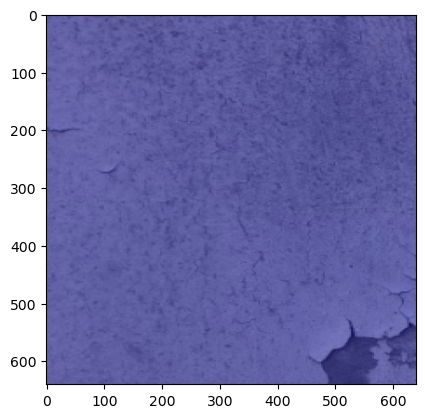

mAP@[0.50:0.95] for 20 epochs: 0.3197
IoU-based Accuracy for 20 epochs: 0.4406


In [30]:
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image

# Set a confidence threshold and iou threshold
confidence_threshold = 0.5
iou_threshold = 0.5

# Switch the model to evaluation mode
model.eval()

# Disable gradient computation for testing
total_loss = 0.0
correct_predictions = 0
total_ground_truth = 0
all_gt_boxes = []  # List of all ground truth boxes
all_pred_boxes = []  # List of all prediction boxes
with torch.no_grad():
    for idx, (images, targets) in enumerate(test_dataloader):

        # Move images and targets to the device
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        try:
          outputs = model(images)

          # Visualize the images and its predictions
          for i, (output, target) in enumerate(zip(outputs, targets)):

            # Extract predicted boxes, labels, and masks
            boxes = output['boxes'].cpu().numpy()
            labels = output['labels'].cpu().numpy()
            masks = output['masks'].cpu().numpy()
            scores = output['scores'].cpu().numpy()

            # Filter predictions based on confidence scores
            high_conf_indices = scores > confidence_threshold
            boxes = boxes[high_conf_indices]
            masks = masks[high_conf_indices]
            labels = labels[high_conf_indices]
            scores = scores[high_conf_indices]

            # Format predictions as (box, score)
            pred_boxes_with_scores = [(box, score) for box, score in zip(boxes, scores)]

            # Get ground truth boxes
            gt_boxes = target['boxes'].cpu().numpy()
            total_ground_truth += len(gt_boxes)

            all_gt_boxes.append(gt_boxes)
            all_pred_boxes.append(pred_boxes_with_scores)

            # Match predictions to ground truth
            for gt_box in gt_boxes:
                for pred_box in boxes:
                    iou = compute_iou(gt_box, pred_box)
                    if iou >= iou_threshold:
                        correct_predictions += 1
                        break  # Avoid double-counting the ground truth box

            # Visualize the first few images
            if idx <= 5:
              # Visualize the image with bounding boxes and masks
              print(f"Image {idx + 1}, Prediction {i + 1}")
              img = to_pil_image(images[i].cpu())
              plt.imshow(img)

              # Overlay bounding boxes
              for j,box in enumerate(boxes):
                  x_min, y_min, x_max, y_max = box
                  plt.gca().add_patch(plt.Rectangle(
                      (x_min, y_min), x_max - x_min, y_max - y_min,
                      edgecolor='red', facecolor='none', linewidth=2
                  ))

                  # Add the confidence score next to the bounding box
                  plt.text(x_min, y_min, f'{scores[j]:.2f}', color='red', fontsize=10)

              # (Optional) Overlay masks
              # Combine all masks into a single overlay for visualization
              combined_mask = masks.sum(axis=0).squeeze()  # Remove the extra dimension

              # Plot the combined mask for first 10 images
              plt.imshow(combined_mask, alpha=0.5, cmap='jet')
              plt.show()
        except AssertionError as e:
          # print(f"Skipping batch due to invalid bounding box: {e}")
          pass

# Compute mAP accuracy
iou_thresholds = np.linspace(0.5, 0.95, 10)  # IoU thresholds from 0.50 to 0.95
map_score = compute_map(all_gt_boxes, all_pred_boxes, iou_thresholds=iou_thresholds)
print(f"mAP@[0.50:0.95] for {num_epochs} epochs: {map_score:.4f}")

# Calculate IoU-based accuracy
accuracy = correct_predictions / total_ground_truth if total_ground_truth > 0 else 0
print(f"IoU-based Accuracy for {num_epochs} epochs: {accuracy:.4f}")

Ground Truth Images

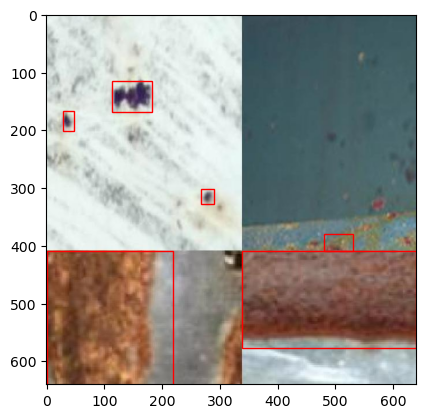

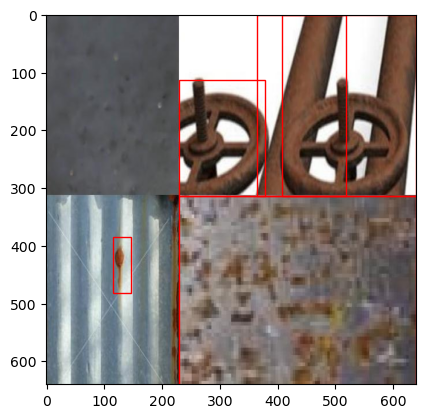

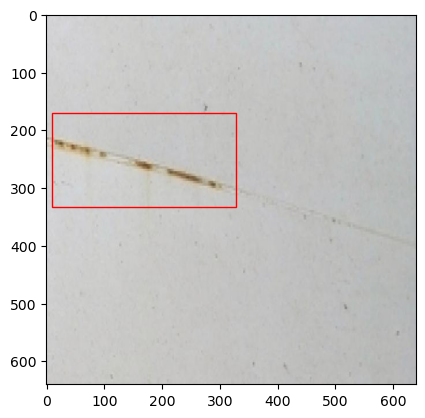

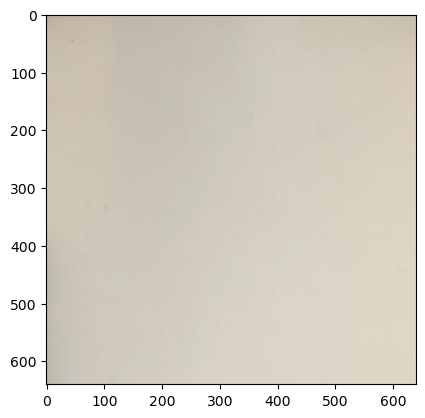

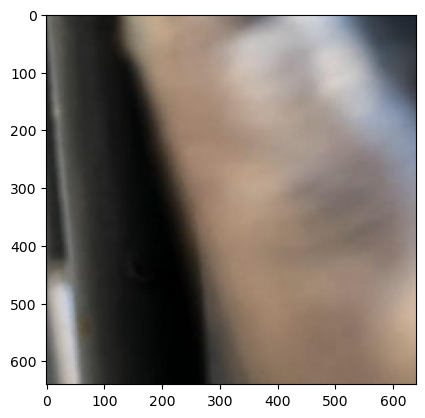

...

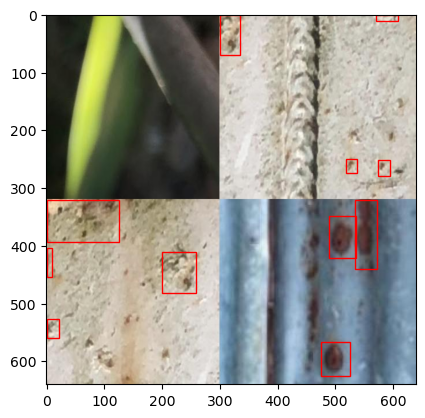

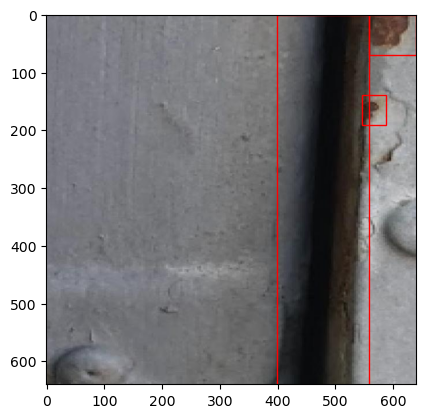

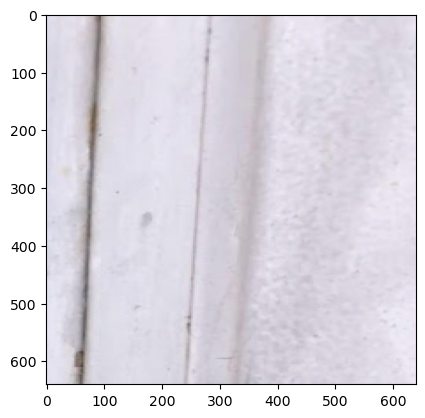

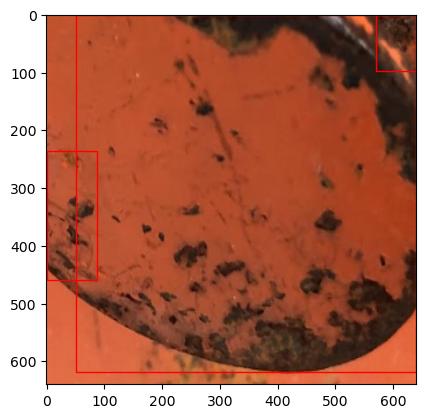

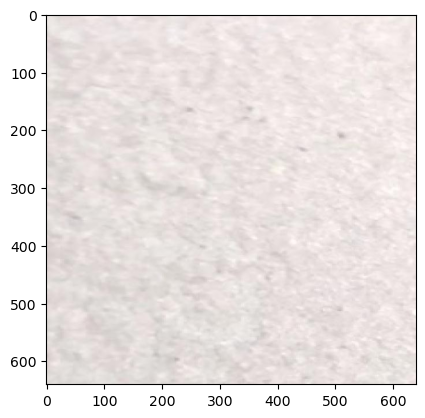

In [23]:
import torchvision.transforms.functional as F

# Visualize test for boxes and masks
for i in range(20):
    img, target = test_dataset[i]
    img = F.to_pil_image(img)
    plt.imshow(img)
    for box in target['boxes']:
        x_min, y_min, x_max, y_max = box
        plt.gca().add_patch(plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, fill=False, color='red'))
    plt.show()

Final Test Results On Random Images Online

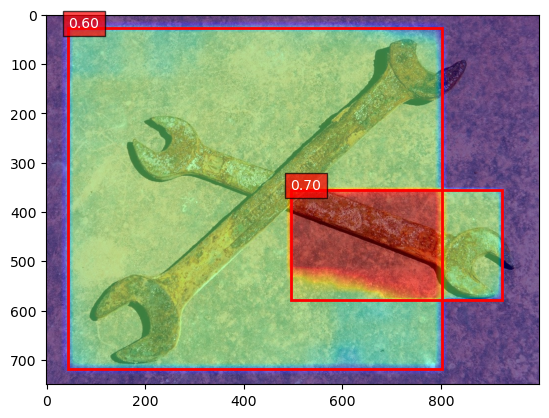

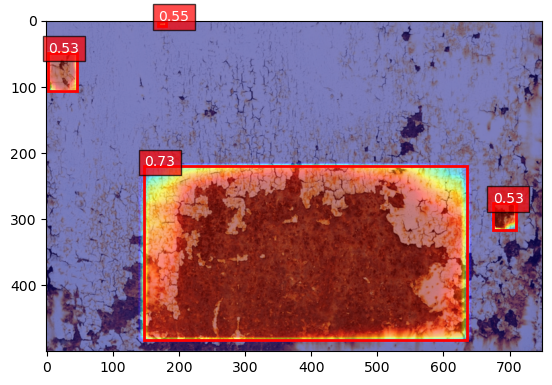

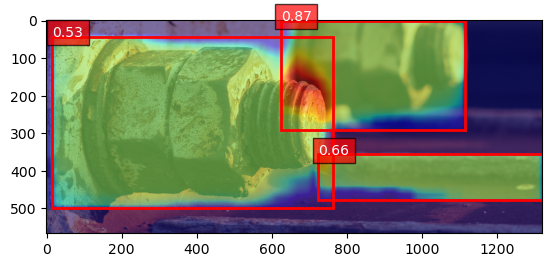

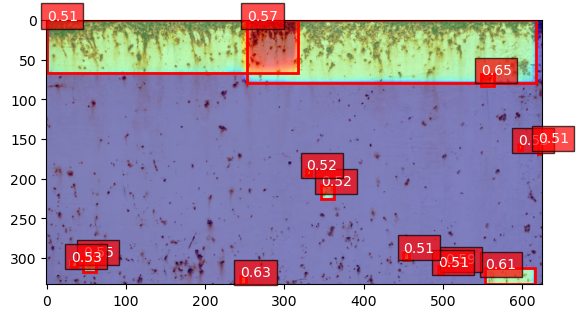

In [40]:
from PIL import Image
# Set a confidence threshold and iou threshold
confidence_threshold = 0.5
iou_threshold = 0.5

# Switch the model to evaluation mode
model.eval()

image_folder = "fp_tests"
# Disable gradient computation for testing
with torch.no_grad():
    for image_name in os.listdir(image_folder):
        image_path = os.path.join(image_folder, image_name)
        
        # Load the image (assuming it's a valid image format like .jpg, .png)
        if image_path.endswith(('.jpg', '.png')):
            img = Image.open(image_path).convert("RGB")
            
            # Transform the image if necessary (e.g., resize, normalize, etc.)
            img_tensor = transform(img).unsqueeze(0).to(device)  # Add batch dimension

            # Perform model inference
            outputs = model(img_tensor)

            # Extract predicted boxes, labels, masks, and scores
            boxes = outputs[0]['boxes'].cpu().numpy()
            labels = outputs[0]['labels'].cpu().numpy()
            masks = outputs[0]['masks'].cpu().numpy()
            scores = outputs[0]['scores'].cpu().numpy()

            # Filter predictions based on confidence scores
            high_conf_indices = scores > confidence_threshold
            boxes = boxes[high_conf_indices]
            masks = masks[high_conf_indices]
            labels = labels[high_conf_indices]
            scores = scores[high_conf_indices]

            # Visualize the image with bounding boxes and confidence scores
            img = to_pil_image(img_tensor.squeeze().cpu())
            plt.imshow(img)

            # Overlay bounding boxes and confidence scores
            for i, box in enumerate(boxes):
                x_min, y_min, x_max, y_max = box
                plt.gca().add_patch(plt.Rectangle(
                    (x_min, y_min), x_max - x_min, y_max - y_min,
                    edgecolor='red', facecolor='none', linewidth=2
                ))

                # Add the confidence score next to the bounding box
                plt.text(x_min, y_min, f'{scores[i]:.2f}', color='white', fontsize=10,
                         bbox=dict(facecolor='red', alpha=0.7))

            # (Optional) Overlay masks
            combined_mask = masks.sum(axis=0).squeeze()  # Remove the extra dimension
            plt.imshow(combined_mask, alpha=0.5, cmap='jet')

            # Show the result
            plt.show()
